In [1]:
import sys
from importlib import reload 
sys.path.append('./lib')

In [2]:
import utils  # expand_to_hyperboloid
utils = reload(utils)

import distances  # Distances, ProductDistances
distances = reload(distances)
from distances import Distances, ProductDistances

import dssm  # DSSM_V2
dssm = reload(dssm)

import layers  # SphericalExponentialMapLayer, HyperbolicalExponentialMapLayer
layers = reload(layers)

__________________________

In [3]:
import networkx as nx
import math
import numpy as np
import matplotlib.pyplot as plt
import tqdm
import os
import collections

from collections import defaultdict
from IPython.display import clear_output

import copy
import numpy as np
import tensorflow as tf
import pandas as pd

import scipy.stats as sps
import pickle

assert int(tf.__version__.split(".")[0]) >= 2

____________________
# Load data

In [4]:
train = pd.read_csv("./true_dssm/req_ans_learn.tsv", sep="\t", header=None)
np.random.seed(17)
train["rnd"] = np.random.rand(len(train))
train = train.sort_values("rnd")
train.head()

,0,1,rnd
144284,u.2,/wiki/U2,2.456372e-07
170822,Kris Wallace,/wiki/Chris_Wallace,1.309875e-06
61024,1980: Mitsubishi produces one million cars...,/wiki/Mitsubishi_Motors,4.676557e-06
201047,code napoleon,/wiki/Napoleonic_Code,1.120069e-05
305336,somersault!,/wiki/Somersault,1.305695e-05


In [5]:
def link_prepare(key):
    return key.split("/wiki/")[1].replace("_", " ")

def link_unprepare(key):
    return "/wiki/" + key.replace(" ", "_")

In [6]:
links = []
for i in tqdm.tqdm_notebook(range(len(train))):
    links.append(str(link_prepare(train.iloc[i][1])))
    # assert link_unprepare(links[-1]) == train.iloc[i][1]

train[1] = np.array(links, dtype=str)

In [7]:
train = train.drop(columns=["rnd"])
train.head()

,0,1
144284,u.2,U2
170822,Kris Wallace,Chris Wallace
61024,1980: Mitsubishi produces one million cars...,Mitsubishi Motors
201047,code napoleon,Napoleonic Code
305336,somersault!,Somersault


In [8]:
len(train.values[:, 1]), len(np.unique(train.values[:, 1]))

(491044, 66060)

__________________________
## 3-Level DSSM

In [9]:
@tf.custom_gradient
def stop_nan_grad(x):  # fix numerical problems with some metrix on bad batches
    def grad(dx):
        if tf.math.is_nan(dx).numpy().any():
            print("NANs in grad! Batch will be ignored")
            return tf.zeros_like(dx)
        else:
            return dx
    return x, grad


class DSSM_3_Layers(dssm.DSSM_V2):
    def __init__(self, emb_size=30, hid_size=256, use_dropout=False):
        super(DSSM_3_Layers, self).__init__(emb_size=emb_size, hid_size=hid_size, wh_buckets=30000)
        self.train = False
        self.use_dropout = use_dropout
        
    def init_layers(self):
        self.dense_in_1 = tf.keras.layers.Dense(self.cfg["hid_size"] * 2, activation=self.cfg["activation"])
        self.drop_in_1 = tf.keras.layers.Dropout(0.1)
        self.dense_in_2 = tf.keras.layers.Dense(self.cfg["hid_size"], activation=self.cfg["activation"])
        self.drop_in_2 = tf.keras.layers.Dropout(0.1)
        self.dense_in_3 = tf.keras.layers.Dense(self.cfg["emb_size"], activation=None)

        self.dense_out_1 = tf.keras.layers.Dense(self.cfg["hid_size"] * 2, activation=self.cfg["activation"])
        self.drop_out_1 = tf.keras.layers.Dropout(0.1)
        self.dense_out_2 = tf.keras.layers.Dense(self.cfg["hid_size"], activation=self.cfg["activation"])
        self.drop_out_2 = tf.keras.layers.Dropout(0.1)
        self.dense_out_3 = tf.keras.layers.Dense(self.cfg["emb_size"], activation=None)
        
    def get_weights(self):
        return (
            self.dense_in_1.weights
            + self.dense_in_2.weights
            + self.dense_in_3.weights
            + self.dense_out_1.weights
            + self.dense_out_2.weights
            + self.dense_out_3.weights 
        )
    
    def call_query(self, q):
        x = q
        x = self.dense_in_1(x)
        x = self.drop_in_1(x, training=self.train and self.use_dropout)
        x = self.dense_in_2(x)
        x = self.drop_in_2(x, training=self.train and self.use_dropout)
        x = self.dense_in_3(x)
        return stop_nan_grad(x) if self.train else x

    def call_doc(self, d):
        x = d
        x = self.dense_out_1(x)
        x = self.drop_out_1(x, training=self.train and self.use_dropout)
        x = self.dense_out_2(x)
        x = self.drop_out_2(x, training=self.train and self.use_dropout)
        x = self.dense_out_3(x)
        return stop_nan_grad(x) if self.train else x

In [10]:
def postprocessing(trainer, d, dist, emb_name, date = "2020-05-05"):
    # save weights
    with open(emb_name + f"-{date}.pickle", "wb") as f:
        pickle.dump(trainer.best_model_weights + trainer.best_dist_weights, f)
    
    # restore best model
    for w, b_w in zip(d.get_weights(), trainer.best_model_weights):
        w.assign(b_w)

    for w, b_w in zip(dist.get_weights(), trainer.best_dist_weights):
        w.assign(b_w)

    # print stats
    print("TRAIN:", trainer.get_train_acc(d, dist, return_metrics=True))
    print("VAL:", trainer.get_val_acc(d, dist, return_metrics=True))
    print("TEST:", trainer.get_test_acc(d, dist, return_metrics=True, bug_fixed=True))
    # 3% of test-data was also val-data

_________________
## Tiny DSSM

In [11]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (10, Distances("inverted_dot")),
])

In [12]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 650460.54it/s]


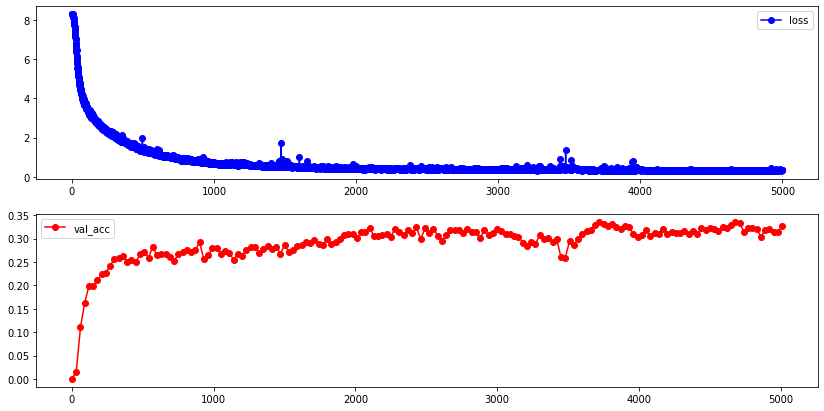

val_acc[-1] = 0.327



In [13]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [14]:
postprocessing(trainer, d, dist, "dssm-exp-10-inverted_dot")


TRAIN: {'hits': 7641, 'total': 10000, 'map100': 0.8519005275456322, 'acc': 0.7641}



VAL: {'hits': 336, 'total': 1000, 'map100': 0.4023361987744546, 'acc': 0.336}



TEST: {'hits': 16772, 'total': 48105, 'map100': 0.41935497349666273, 'acc': 0.3486539860721339}


_______________________

In [15]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (10, Distances("euclidian")),
])

In [16]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 652927.48it/s]


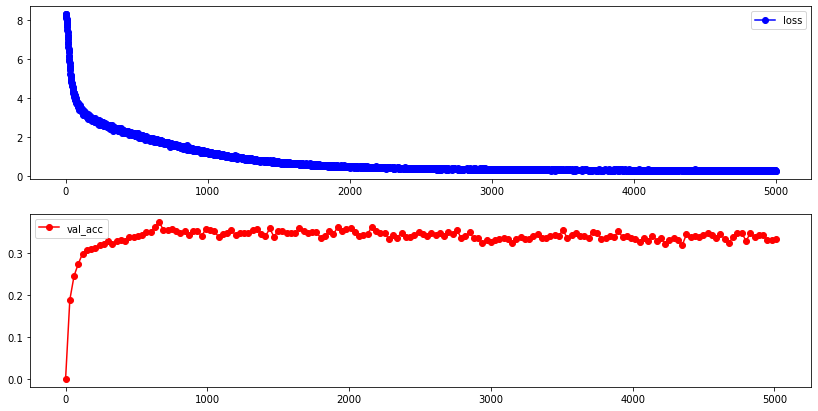

val_acc[-1] = 0.334



In [17]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [18]:
postprocessing(trainer, d, dist, "dssm-exp-10-euclidian")


TRAIN: {'hits': 4785, 'total': 10000, 'map100': 0.5654407287583816, 'acc': 0.4785}



VAL: {'hits': 375, 'total': 1000, 'map100': 0.4428452218929104, 'acc': 0.375}



TEST: {'hits': 17937, 'total': 48105, 'map100': 0.4458899621306429, 'acc': 0.3728718428437792}


_______________________

In [19]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (10, Distances("spherical")),
])

In [20]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 676348.05it/s]


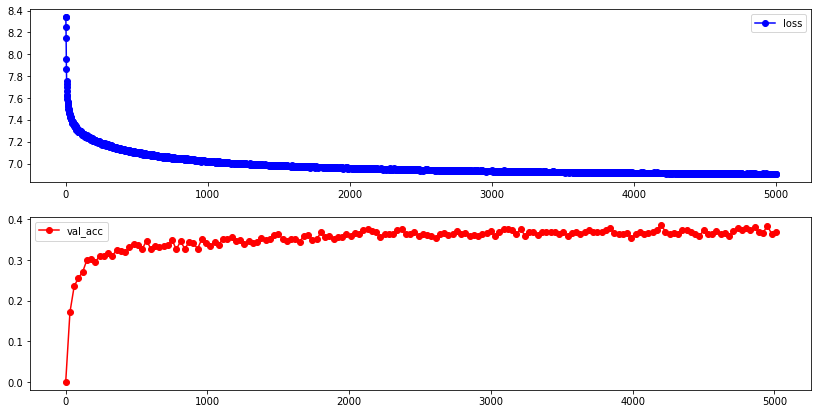

val_acc[-1] = 0.368



In [21]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [22]:
postprocessing(trainer, d, dist, "dssm-exp-10-spherical")


TRAIN: {'hits': 9352, 'total': 10000, 'map100': 0.9538454529415696, 'acc': 0.9352}



VAL: {'hits': 387, 'total': 1000, 'map100': 0.44134981075225566, 'acc': 0.387}



TEST: {'hits': 19712, 'total': 48105, 'map100': 0.46874202883818084, 'acc': 0.4097702941482174}


_______________________

In [23]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (10, Distances("expanded_hyp")),
])

In [24]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 656583.05it/s]


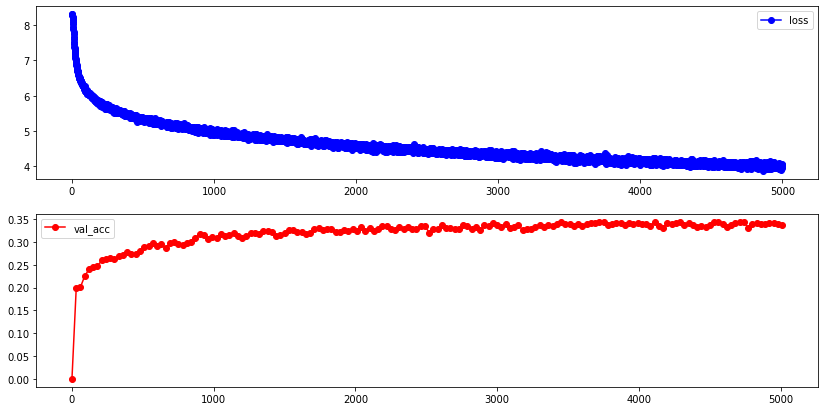

val_acc[-1] = 0.337



In [25]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [26]:
postprocessing(trainer, d, dist, "dssm-exp-10-expanded_hyp")


TRAIN: {'hits': 5024, 'total': 10000, 'map100': 0.5333003702363761, 'acc': 0.5024}



VAL: {'hits': 344, 'total': 1000, 'map100': 0.37894208548834896, 'acc': 0.344}



TEST: {'hits': 17438, 'total': 48105, 'map100': 0.40473499725001655, 'acc': 0.3624987007587569}


_______________________

In [27]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (10, Distances("triple_trainable_l1", dtype=d.dense_in_1.dtype)),
])

In [28]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 654809.14it/s]


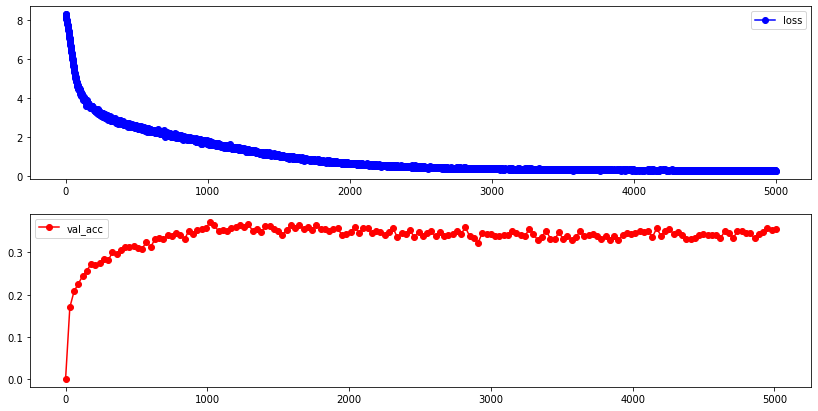

val_acc[-1] = 0.356



In [29]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [30]:
postprocessing(trainer, d, dist, "dssm-exp-10-ttl1")


TRAIN: {'hits': 4906, 'total': 10000, 'map100': 0.5784969299509138, 'acc': 0.4906}



VAL: {'hits': 373, 'total': 1000, 'map100': 0.4361508745206637, 'acc': 0.373}



TEST: {'hits': 18171, 'total': 48105, 'map100': 0.4498252640614855, 'acc': 0.3777362020579981}


_______________________

In [31]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (10, Distances("triple_trainable_l1_sq", dtype=d.dense_in_1.dtype)),
])

In [32]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 647292.58it/s]


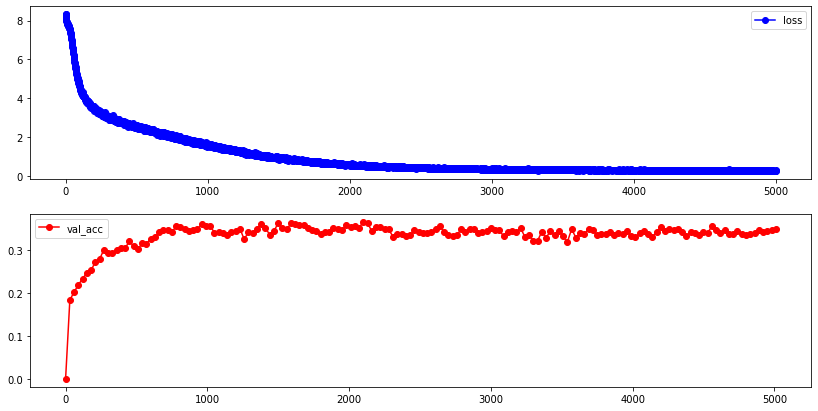

val_acc[-1] = 0.349



In [33]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [34]:
postprocessing(trainer, d, dist, "dssm-exp-10-ttl1_sq")


TRAIN: {'hits': 6845, 'total': 10000, 'map100': 0.78195300707643, 'acc': 0.6845}



VAL: {'hits': 365, 'total': 1000, 'map100': 0.4286329938375343, 'acc': 0.365}



TEST: {'hits': 17943, 'total': 48105, 'map100': 0.44564611620873734, 'acc': 0.3729965700031182}


_______________________

In [35]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (10, Distances("triple_trainable_l0", dtype=d.dense_in_1.dtype)),
])

In [36]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 653197.60it/s]


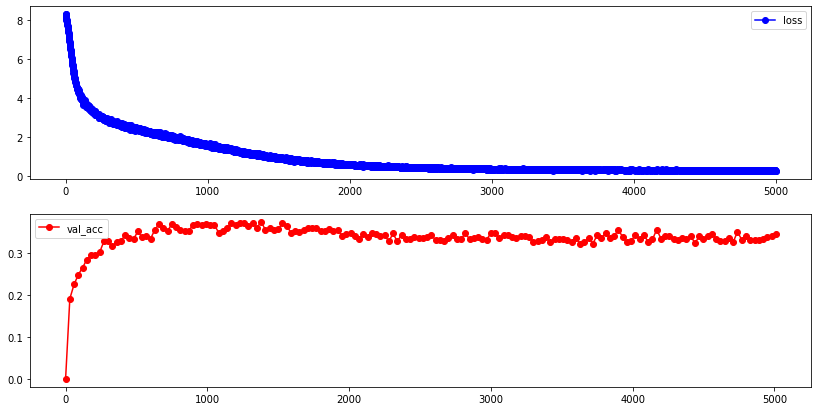

val_acc[-1] = 0.344



In [37]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [38]:
postprocessing(trainer, d, dist, "dssm-exp-10-ttl0")


TRAIN: {'hits': 5887, 'total': 10000, 'map100': 0.6840307443425317, 'acc': 0.5887}



VAL: {'hits': 374, 'total': 1000, 'map100': 0.44195331729123294, 'acc': 0.374}



TEST: {'hits': 18418, 'total': 48105, 'map100': 0.4562016786209497, 'acc': 0.3828708034507847}


_______________________

In [39]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (5, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
    (5, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
])

In [40]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 662778.77it/s]


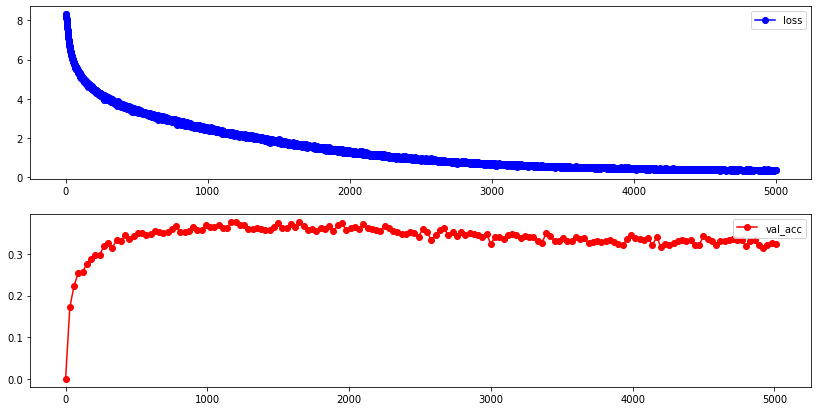

val_acc[-1] = 0.324



In [41]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [42]:
postprocessing(trainer, d, dist, "dssm-exp-10-H5-H5")


TRAIN: {'hits': 5536, 'total': 10000, 'map100': 0.6125217953546429, 'acc': 0.5536}



VAL: {'hits': 377, 'total': 1000, 'map100': 0.43321794076858294, 'acc': 0.377}



TEST: {'hits': 18691, 'total': 48105, 'map100': 0.44928355002468096, 'acc': 0.38854588920070676}


_______________________

In [43]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (5, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
    (5, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
])

In [44]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 640459.38it/s]


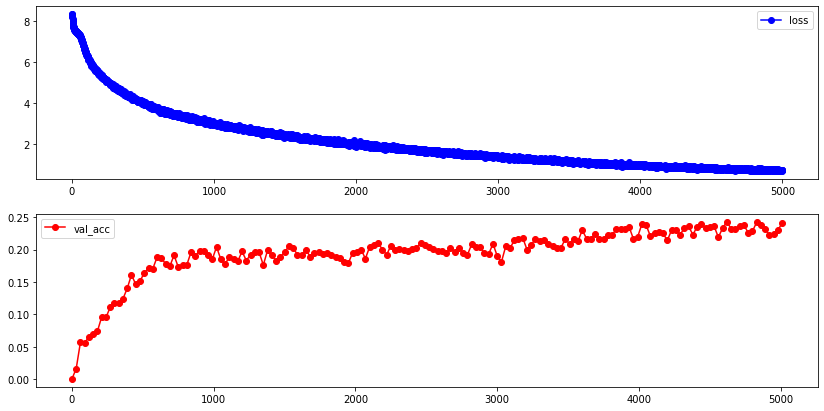

val_acc[-1] = 0.241



In [45]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [46]:
postprocessing(trainer, d, dist, "dssm-exp-10-H5-S5")


TRAIN: {'hits': 7392, 'total': 10000, 'map100': 0.8104485294709853, 'acc': 0.7392}



VAL: {'hits': 243, 'total': 1000, 'map100': 0.301983548868701, 'acc': 0.243}



TEST: {'hits': 12016, 'total': 48105, 'map100': 0.31086641112812025, 'acc': 0.2497869244361293}


_______________________

In [47]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (5, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
    (5, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
])

In [48]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 651640.93it/s]


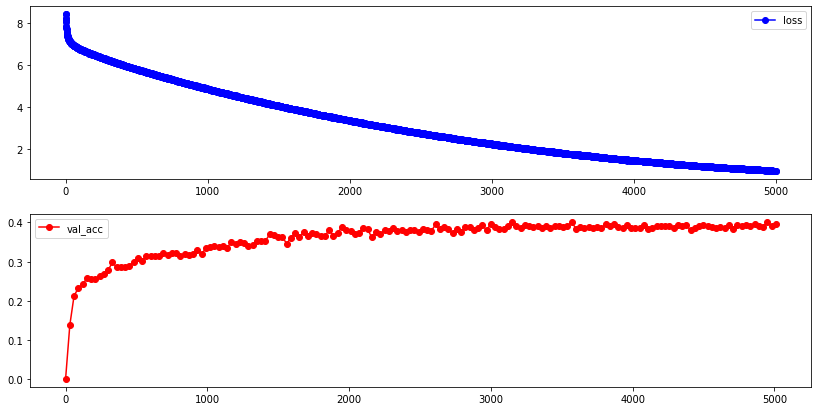

val_acc[-1] = 0.395



In [49]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [50]:
postprocessing(trainer, d, dist, "dssm-exp-10-S5-S5")


TRAIN: {'hits': 9348, 'total': 10000, 'map100': 0.9537729281483366, 'acc': 0.9348}



VAL: {'hits': 402, 'total': 1000, 'map100': 0.45489430862510155, 'acc': 0.402}



TEST: {'hits': 19916, 'total': 48105, 'map100': 0.47202807731355934, 'acc': 0.4140110175657416}


________________
_________________


_______________________

_______________________

In [51]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (2, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
])

In [52]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 672182.96it/s]


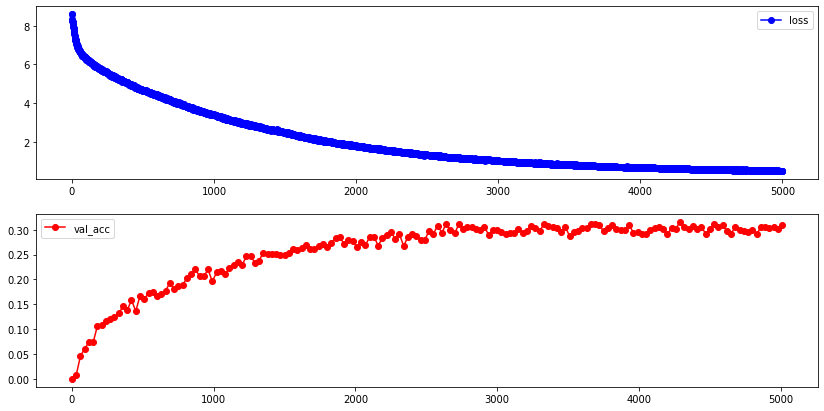

val_acc[-1] = 0.309



In [53]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [54]:
dist.get_weights()

[<tf.Variable 'Variable:0' shape=() dtype=float32, numpy=4.6271677>,
 <tf.Variable 'Variable:0' shape=() dtype=float32, numpy=4.609084>,
 <tf.Variable 'Variable:0' shape=() dtype=float32, numpy=4.549238>,
 <tf.Variable 'Variable:0' shape=() dtype=float32, numpy=4.550915>,
 <tf.Variable 'Variable:0' shape=() dtype=float32, numpy=4.5680156>]

In [55]:
postprocessing(trainer, d, dist, "dssm-exp-10-S2x5_sq")

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999998807907104
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad 

Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0,

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0,

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119209

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sphe

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000119209

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.00

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad sph

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896


Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.000000238418579, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical c

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896


Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine =

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119209

Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad 

Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999998807907104
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine =

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad sp

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine =

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896


Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999998807907104
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine =

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical c

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011920

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011920

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0,

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.999999940

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cos

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.99999

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000119209

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896,

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0,

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011920928

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999998807907104
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896


Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine 

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine =

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine =

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0,

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999998807907104
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

_______________________

In [56]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (2, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
])

In [57]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 673596.04it/s]


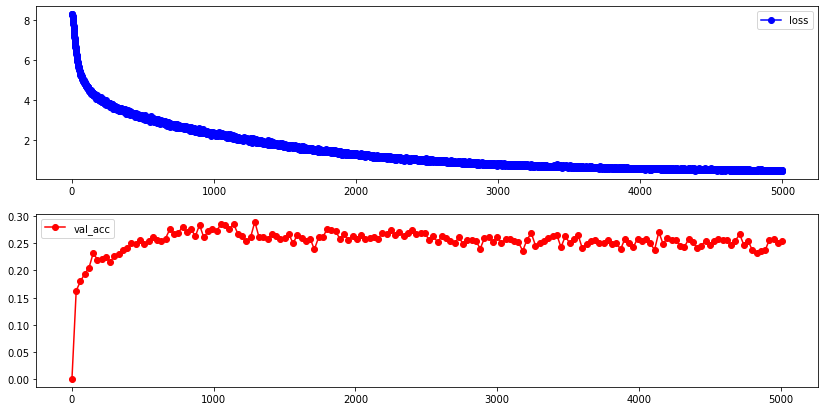

val_acc[-1] = 0.254



In [58]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [59]:
postprocessing(trainer, d, dist, "dssm-exp-10-H2x5_sq")

Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolica

Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.99993896484375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolica

Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.99993896484375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.99993896484375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.99993896484375
Bad hyperbolical do

Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical

Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical do

Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical d

Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.99993896484375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolica

Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.99993896484375
Bad hyperbolical dot = -0.99993896484375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.99993896484375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot

Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolic

Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999961853027344
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999923706054688
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.9999990463256836
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical dot = -0.9999980926513672
Bad hyperbolical dot = -0.999969482421875
Bad hyperbolical d

In [60]:
trainer.best_dist_weights

[1.8214574, 1.7706949, 1.7920623, 1.770548, 1.7496]

In [61]:
tf.nn.softmax(trainer.best_dist_weights)

<tf.Tensor: id=640576498, shape=(5,), dtype=float32, numpy=
array([0.20822205, 0.19791596, 0.20219043, 0.1978869 , 0.19378468],
      dtype=float32)>

_______________________

In [62]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (2, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("expanded_hyp", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("spherical", scalable=True, dtype=d.dense_in_1.dtype)),
    (2, Distances("euclidian", scalable=True, dtype=d.dense_in_1.dtype)),
])

In [63]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 671356.92it/s]


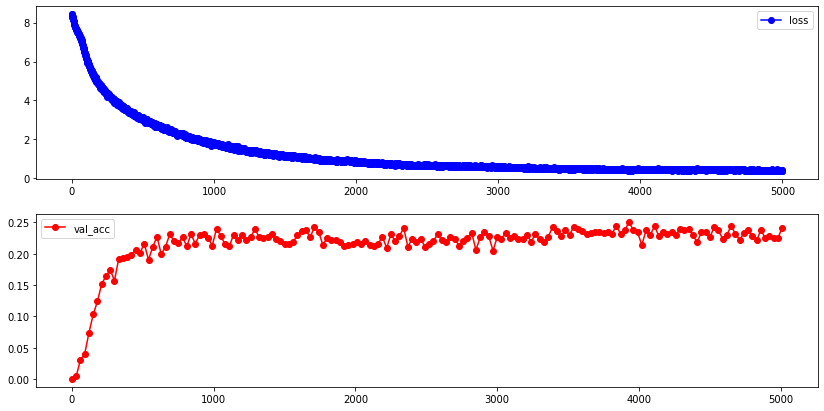

val_acc[-1] = 0.241



In [64]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [65]:
postprocessing(trainer, d, dist, "dssm-exp-10-H2x2-S2x2-E2_sq")

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical 

Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine =

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999980926513672
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sph

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot =

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0


Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999998807907104, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.

Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896

TRAIN: {'hits': 7525, 'total': 10000, 'map100': 0.8306633801797394, 'acc': 0.7525}


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad sphe

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.99993896484375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00000011920

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.99993896484375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine =

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical do

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.99993896484375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spher

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011920

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.00000011920928

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.000000238418579
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011920

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0,

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine =

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad hyperbolical dot = -0.999969482421875
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092

Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.99999

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad sph

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.999969482421875
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sph

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.00000

Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.00

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999980926513672
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999980926513672
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011920

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine =

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sphe

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sphe

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000119209289

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.999969482421875
Bad spherical cosine = -1.0, 1.0000001192092896
Bad sph

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine =

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000023

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0


Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Ba

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.00000011920928

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosi

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 0.9999998807907104
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sph

Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011920

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spheric

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000119209

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119209289

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0


Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.00

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad 

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00

Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011920

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.999969482421875
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = 

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999980926513672
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.00000011920928

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine =

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sphe

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Ba

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cos

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad hyperbolic

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999961853027344
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine 

Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad s

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000011

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
B

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000119

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000119

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 0.9999999403953552
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -0.9999999403953552, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical co

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.00000

Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.000000238418579, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999847412109375
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosin

Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.000000238418579, 1.000000238418579
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sp

Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad hyperbolical dot = -0.9999923706054688
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0, 1.0000001192092896
Bad spherical cosine = -1.0000001192092896, 1.0
Bad spherical cosine = -1.0000001192092896, 1.0000001192092896
Bad sp

In [66]:
trainer.best_dist_weights

[2.560393, 2.6308818, 3.4711049, 3.331111, 2.1142578]

In [67]:
tf.nn.softmax(trainer.best_dist_weights)

<tf.Tensor: id=716308729, shape=(5,), dtype=float32, numpy=
array([0.13585964, 0.14578179, 0.33775946, 0.29363576, 0.08696336],
      dtype=float32)>

_________________________

In [21]:
d = DSSM_3_Layers(hid_size=256, emb_size=10)
dist = ProductDistances([
    (10, Distances("inverted_cosine", scalable=False, dtype=d.dense_in_1.dtype)),
], "sum")

In [22]:
trainer = dssm.trainer.DssmTrainerWithCustomTokenizerAndHards(model=d, qs=train, hard_every=99999,
    tokenizer_cfg={"total_tokens":30000, "triplets_weight":20, "pairs_weight":2, "words_weight":8})

100%|██████████| 441939/441939 [00:00<00:00, 456456.73it/s]


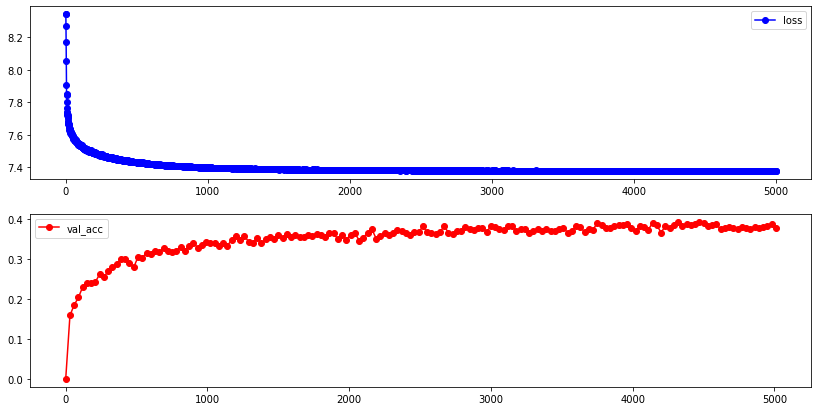

val_acc[-1] = 0.378


In [23]:
trainer.fit(d, dist, redraw_interval=30, iters=5000)

In [26]:
postprocessing(trainer, d, dist, "minus_cos_10", date = "2020-06-02")

TRAIN: {'hits': 9634, 'total': 10000, 'map100': 0.9773042810434932, 'acc': 0.9634}


VAL: {'hits': 393, 'total': 1000, 'map100': 0.44819620778388314, 'acc': 0.393}


TEST: {'hits': 19873, 'total': 48105, 'map100': 0.47116336868684616, 'acc': 0.4131171395904792}


In [38]:
with open("dssm-exp-256-ttl0_256-nohn-2020-05-01-dist.pickle", "rb") as f:
    x = pickle.load(f)
tf.nn.softmax(x[-1])

<tf.Tensor: id=9, shape=(3,), dtype=float64, numpy=array([0.55514907, 0.21076672, 0.23408421])>

In [39]:
with open("dssm-exp-10-ttl0-2020-05-07.pickle", "rb") as f:
    x = pickle.load(f)
tf.nn.softmax(x[-1])

<tf.Tensor: id=11, shape=(3,), dtype=float32, numpy=array([0.5610538 , 0.2225534 , 0.21639277], dtype=float32)>

In [40]:
!ls -la | grep "dssm-exp"

-rw-rw-r-- 1 shevkunov dpt_yandex_monetize_banner_adv_modern 123955892 Apr  8 06:57 dssm-exp-10-euclidian-2020-04-07.pickle
-rw-rw-r-- 1 shevkunov dpt_yandex_monetize_banner_adv_modern 123955892 May  5 23:25 dssm-exp-10-euclidian-2020-05-05.pickle
-rw-rw-r-- 1 shevkunov dpt_yandex_monetize_banner_adv_modern 123955892 May  8 08:11 dssm-exp-10-euclidian-2020-05-07.pickle
-rw-rw-r-- 1 shevkunov dpt_yandex_monetize_banner_adv_modern 123955892 Apr  8 20:54 dssm-exp-10-expanded_hyp-2020-04-07.pickle
-rw-rw-r-- 1 shevkunov dpt_yandex_monetize_banner_adv_modern 123955892 May  6 03:58 dssm-exp-10-expanded_hyp-2020-05-05.pickle
-rw-rw-r-- 1 shevkunov dpt_yandex_monetize_banner_adv_modern 123955892 May  8 17:15 dssm-exp-10-expanded_hyp-2020-05-07.pickle
-rw-rw-r-- 1 shevkunov dpt_yandex_monetize_banner_adv_modern 123956012 Apr 14 21:00 dssm-exp-10-H2x2-S2x2-E2_sq-2020-04-07.pickle
-rw-rw-r-- 1 shevkunov dpt_yandex_monetize_banner_adv_modern 123956012 May  7 17:09 dssm-exp-10-H2x2-S2x2-E2_sq-2020-